<a href="https://colab.research.google.com/github/JahanavDixit/Emotion-Classification/blob/main/Emotion_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Importing the dataset

In [ ]:
!cp drive/MyDrive/emotion.zip /content/
!unzip emotion.zip

Archive:  emotion.zip
  inflating: faceEmotionDetection/validation/Haasya/WhatsApp Image 2022-05-03 at 8.08.16 PM (2)_0.jpg  
  inflating: faceEmotionDetection/train/Veer/IMG_2082_0.jpg  
  inflating: faceEmotionDetection/train/Veer/IMG_2081_0.jpg  
  inflating: faceEmotionDetection/train/adhbut/WhatsApp Image 2022-05-03 at 8.08.15 PM (2)_0.jpg  
  inflating: faceEmotionDetection/validation/Haasya/WhatsApp Image 2022-05-03 at 8.08.14 PM (2)_0.jpg  
  inflating: faceEmotionDetection/validation/Bhyanak/IMG_2183_0.jpg  
  inflating: faceEmotionDetection/train/Veer/IMG_2079_0.jpg  
  inflating: faceEmotionDetection/validation/Shant/9-Shant Rasa_0.jpg  
  inflating: faceEmotionDetection/validation/Karun/3-Karuna Rasa_0.jpg  
  inflating: faceEmotionDetection/validation/Shant/IMG_2214_0.jpg  
  inflating: faceEmotionDetection/validation/Shant/IMG_2213_0.jpg  
  inflating: faceEmotionDetection/validation/Karun/IMG_1981_0.jpg  
  inflating: faceEmotionDetection/validation/Shrungar/IMG_2024_0.j

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Adding Augumentation and Managing Class Imbalance

In [ ]:
import os
import cv2
import numpy as np
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_dir = '/content/faceEmotionDetection/train'
val_dir = '/content/faceEmotionDetection/validation'

image_size = (256, 256)
batch_size = 32

train_images = []
train_labels = []

val_images = []
val_labels = []

class_names = os.listdir(train_dir)

label_encoder = LabelEncoder()
label_encoder.fit(class_names)
num_labels = len(label_encoder.classes_)

onehot_encoder = OneHotEncoder(sparse=False)

datagen = ImageDataGenerator(
    rotation_range=90,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
)

# Calculate target number of images for augmentation
target_num_images = 250

# Training data augmentation
for class_name in class_names:
    class_dir = os.path.join(train_dir, class_name)
    label = class_name

    images = os.listdir(class_dir)
    num_images = len(images)
    num_augmentations = target_num_images - num_images if num_images < target_num_images else 0

    for image_name in images:
        image_path = os.path.join(class_dir, image_name)
        image = cv2.imread(image_path)
        image = cv2.resize(image, image_size)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        train_images.append(image)
        train_labels.append(label)

    # Apply more augmentation to classes with fewer images
    if num_images < target_num_images:
        augmentations_needed = target_num_images - num_images
        augmented_images = datagen.flow(np.array(train_images[-num_images:]), batch_size=1)
        for _ in range(augmentations_needed):
            augmented_image = augmented_images.next()[0]
            train_images.append(augmented_image)
            train_labels.append(label)

train_images = np.array(train_images) / 255.0
train_labels = label_encoder.transform(train_labels).reshape(-1, 1)
train_labels = onehot_encoder.fit_transform(train_labels)

# Shuffle the training data
shuffle_indices = np.arange(len(train_images))
np.random.shuffle(shuffle_indices)
train_images = train_images[shuffle_indices]
train_labels = train_labels[shuffle_indices]

# Validation data (no augmentation)
for class_name in class_names:
    class_dir = os.path.join(val_dir, class_name)
    label = class_name

    for image_name in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_name)
        image = cv2.imread(image_path)
        image = cv2.resize(image, image_size)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        val_images.append(image)
        val_labels.append(label)

val_images = np.array(val_images) / 255.0
val_labels = label_encoder.transform(val_labels).reshape(-1, 1)
val_labels = onehot_encoder.transform(val_labels)

# Shuffle the validation data
shuffle_indices = np.arange(len(val_images))
np.random.shuffle(shuffle_indices)
val_images = val_images[shuffle_indices]
val_labels = val_labels[shuffle_indices]


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
class_frequencies = np.sum(train_labels, axis=0)
print(class_frequencies)
max_frequency = np.max(class_frequencies)
class_weights = max_frequency / class_frequencies
normalized_class_weights = class_weights / np.sum(class_weights) * num_labels

class_indices = np.arange(num_labels)
class_weight_dict = dict(zip(class_indices, normalized_class_weights))
class_weight_dict

[250. 250. 250. 250. 250. 250. 250. 250. 250.]


{0: 1.0, 1: 1.0, 2: 1.0, 3: 1.0, 4: 1.0, 5: 1.0, 6: 1.0, 7: 1.0, 8: 1.0}

In [ ]:
a = '/content/faceEmotionDetection/train/'
class_names = os.listdir(a)
print([len(os.listdir(os.path.join(a, class_name))) for class_name in class_names])

[138, 101, 44, 8, 144, 115, 7, 8, 9]


## Displaying the training images

/usr/local/lib/python3.10/dist-packages/matplotlib/text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


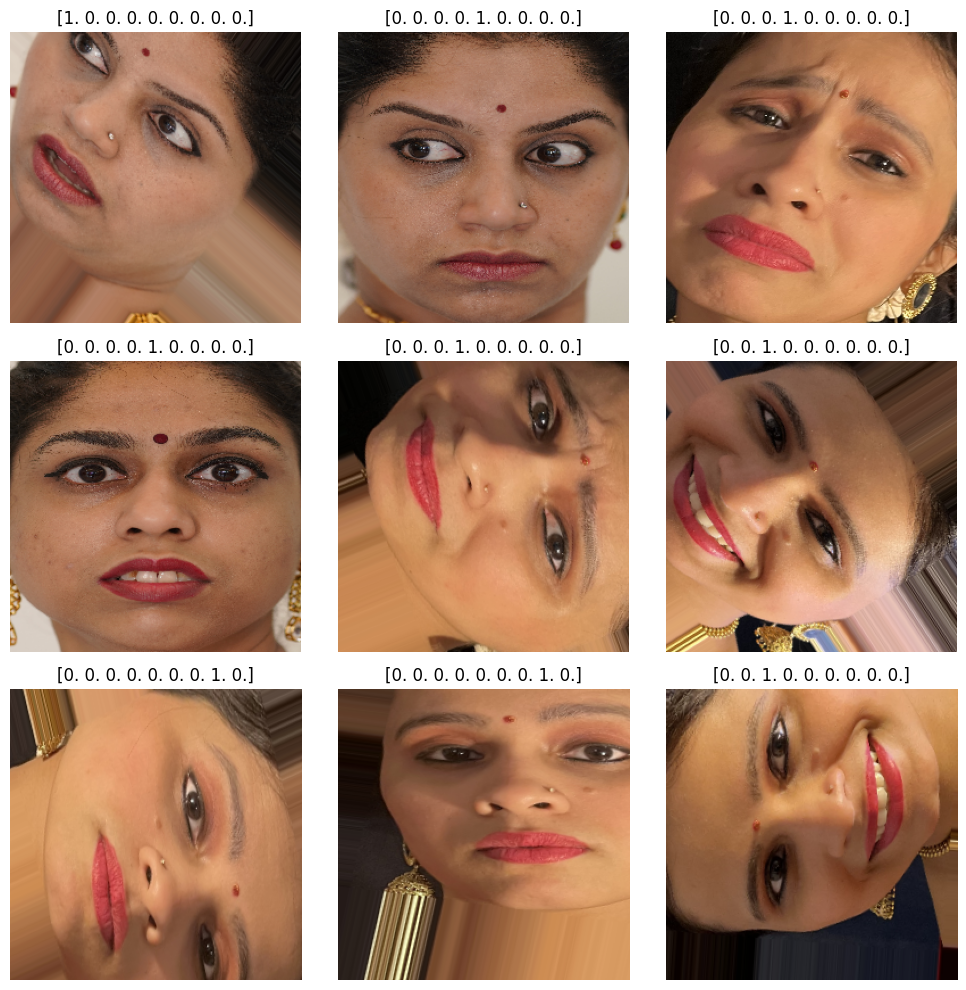

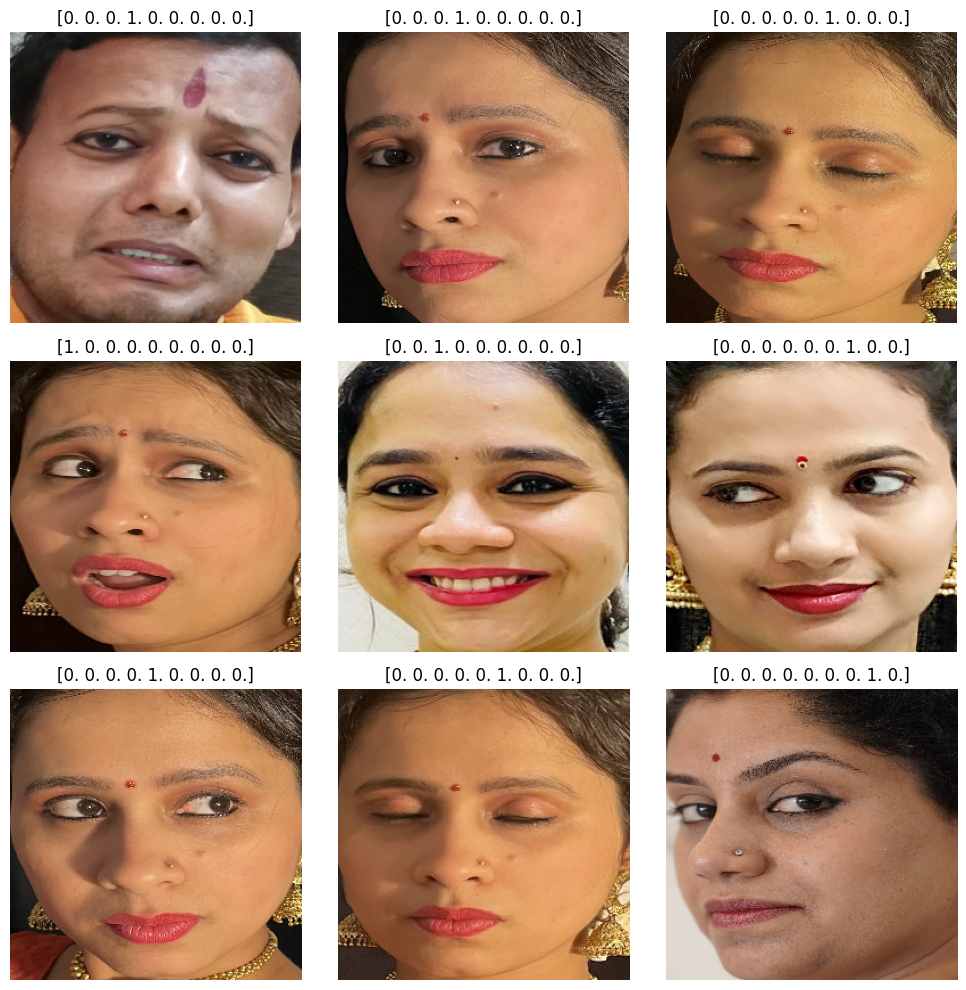

In [ ]:
import matplotlib.pyplot as plt

# Display some training images
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10, 10))

for i, ax in enumerate(axes.flatten()):
    ax.imshow(train_images[i])
    ax.set_title(train_labels[i])
    ax.axis('off')

plt.tight_layout()
plt.show()

# Display some validation images
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10, 10))

for i, ax in enumerate(axes.flatten()):
    ax.imshow(val_images[i])
    ax.set_title(val_labels[i])
    ax.axis('off')

plt.tight_layout()
plt.show()


## Without Augumentation

In [ ]:
import os
import cv2
import numpy as np
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
train_dir = '/content/faceEmotionDetection/train'
val_dir = '/content/faceEmotionDetection/validation'
image_size = (256, 256)

train_images = []
train_labels = []

val_images = []
val_labels = []

class_names = os.listdir(train_dir)

label_encoder = LabelEncoder()
label_encoder.fit(class_names)
num_labels = len(label_encoder.classes_)

onehot_encoder = OneHotEncoder(sparse=False)

for class_name in class_names:
    class_dir = os.path.join(train_dir, class_name)
    label = class_name  # Use the directory name as the label

    for image_name in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_name)
        image = cv2.imread(image_path)
        image = cv2.resize(image, image_size)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        train_images.append(image)
        train_labels.append(label)

train_images = np.array(train_images)
train_labels = label_encoder.transform(train_labels).reshape(-1, 1)
train_labels = onehot_encoder.fit_transform(train_labels)

for class_name in class_names:
    class_dir = os.path.join(val_dir, class_name)
    label = class_name

    for image_name in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_name)
        image = cv2.imread(image_path)
        image = cv2.resize(image, image_size)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        val_images.append(image)
        val_labels.append(label)

val_images = np.array(val_images)
val_labels = label_encoder.transform(val_labels).reshape(-1, 1)
val_labels = onehot_encoder.transform(val_labels)


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


## Model Training

In [ ]:
from tensorflow import keras
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adam

resnet = keras.applications.InceptionV3(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Set the layers in the ResNet model as non-trainable
for layer in resnet.layers:
    layer.trainable = False

new_output = resnet.output
#new_output = keras.layers.Dropout(rate=0.5)(new_output)
new_output = keras.layers.Conv2D(55, kernel_size=(3, 3), activation='relu', padding='same')(new_output)
new_output = keras.layers.GlobalAveragePooling2D()(new_output)
new_output = keras.layers.Dropout(rate=0.5)(new_output)
new_output = keras.layers.Dense(29, activation='relu',
                                kernel_regularizer=regularizers.l1_l2(l1=0.01, l2=0.01))(new_output)
new_output = keras.layers.BatchNormalization()(new_output)
new_output = keras.layers.Dropout(rate=0.5)(new_output)
    # add new dense layer for our labels
new_output = keras.layers.Dense(9, activation='softmax')(new_output)

model = keras.Model(resnet.inputs, new_output)

for layer in model.layers:
        layer.trainable = True

    # fix deep layers (fine-tuning only last 100)
for layer in model.layers[:-100]:
        layer.trainable = False

# model = keras.models.Sequential([
#     resnet,
#     keras.layers.Flatten(),
#     keras.layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l1_l2(l1=0.01, l2=0.01)),
#     keras.layers.BatchNormalization(),
#     keras.layers.Dropout(rate=0.5),
#     keras.layers.Dense(9, activation='softmax')
# ])
lr = 1e-3
epochs = 50

opt = Adam(learning_rate=lr, weight_decay=lr / (epochs * 0.5))
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])


87910968/87910968 [==============================] - 1s 0us/step


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=4, verbose=1)
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=3, verbose=1),
    tf.keras.callbacks.ModelCheckpoint(filepath='./model.h5', monitor='val_loss',
                                       save_best_only=True, verbose=1)
]
aug = ImageDataGenerator(
    rotation_range=360,
    zoom_range=0.2,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest")

history = model.fit(train_images, train_labels, batch_size=32, epochs=epochs, verbose=1, validation_data=(val_images, val_labels),callbacks=callbacks)


Epoch 1/50
71/71 [==============================] - ETA: 0s - loss: 4.9520 - accuracy: 0.1360
Epoch 1: val_loss improved from inf to 6.56886, saving model to ./model.h5
71/71 [==============================] - 39s 219ms/step - loss: 4.9520 - accuracy: 0.1360 - val_loss: 6.5689 - val_accuracy: 0.0278
Epoch 2/50
71/71 [==============================] - ETA: 0s - loss: 3.9689 - accuracy: 0.1933
Epoch 2: val_loss improved from 6.56886 to 3.98524, saving model to ./model.h5
71/71 [==============================] - 10s 144ms/step - loss: 3.9689 - accuracy: 0.1933 - val_loss: 3.9852 - val_accuracy: 0.1944
Epoch 3/50
71/71 [==============================] - ETA: 0s - loss: 2.9849 - accuracy: 0.3476
Epoch 3: val_loss improved from 3.98524 to 2.84600, saving model to ./model.h5
71/71 [==============================] - 10s 147ms/step - loss: 2.9849 - accuracy: 0.3476 - val_loss: 2.8460 - val_accuracy: 0.2222
Epoch 4/50
71/71 [==============================] - ETA: 0s - loss: 2.2571 - accuracy: 0.

## Plotting the training session

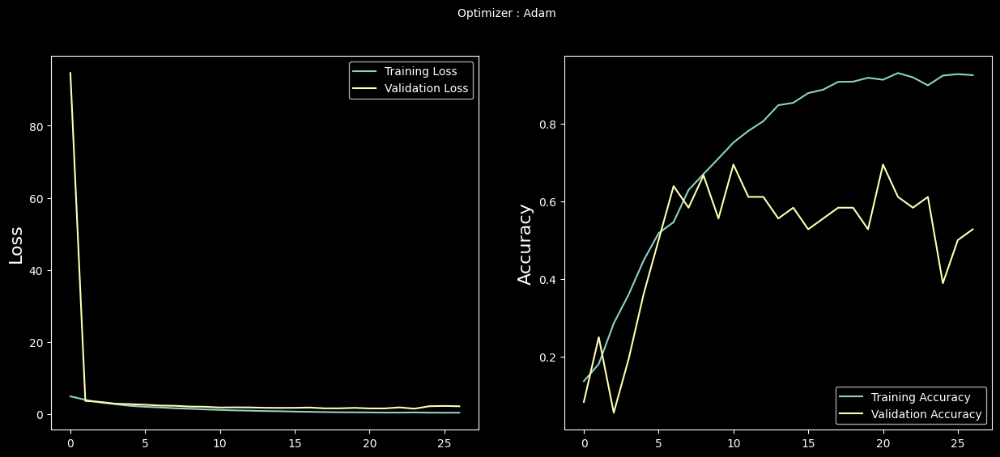

In [ ]:
import matplotlib.pyplot as plt
plt.style.use('dark_background')

plt.figure(figsize=(15,6))
plt.subplot(1, 2, 1)
plt.suptitle('Optimizer : Adam', fontsize=10)
plt.ylabel('Loss', fontsize=16)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')

plt.subplot(1, 2, 2)
plt.ylabel('Accuracy', fontsize=16)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend(loc='lower right')
plt.show()

## Loading the model and Predicting the Facial Expression

In [ ]:
!unzip /content/drive/MyDrive/validation-20230608T121349Z-001.zip -d /content/
!cp /content/drive/MyDrive/model.h5 /content/

Archive:  /content/drive/MyDrive/validation-20230608T121349Z-001.zip
replace /content/validation/Haasya/1650984246359.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [ ]:
!wget https://raw.githubusercontent.com/keyurr2/face-detection/master/deploy.prototxt.txt
!wget https://raw.githubusercontent.com/keyurr2/face-detection/master/res10_300x300_ssd_iter_140000.caffemodel

In [ ]:
import os
import cv2
import numpy as np
# Set the paths for the input and output folders
input_dir = '/content/validation/'
output_dir = '/content/extracted_faces'

# Define a function to detect faces in an image and save them to a new folder
def extract_faces(input_path, output_path):
    # Load the image
    img = cv2.imread(input_path)

    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Load the face detection model
    caffeModelFile = "/content/res10_300x300_ssd_iter_140000.caffemodel"
    caffeProtoTxt = "/content/deploy.prototxt.txt"
    caffeDetector = cv2.dnn.readNetFromCaffe(caffeProtoTxt, caffeModelFile)

    # Detect faces in the image
    (h, w) = img.shape[:2]
    blob = cv2.dnn.blobFromImage(cv2.resize(img, (300, 300)), 1.0, (300, 300), (104.0, 177.0, 123.0))
    caffeDetector.setInput(blob)
    detections = caffeDetector.forward()

    # Save each face as a new image in the output folder
    for i in range(0, detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > 0.5:
            box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
            (startX, startY, endX, endY) = box.astype("int")
            face_img = img[startY:endY, startX:endX]
            cv2.imwrite(os.path.join(output_path, f'{os.path.splitext(os.path.basename(input_path))[0]}_{i}.jpg'), face_img)

# Loop over each class folder in the input directory
for class_folder in os.listdir(input_dir):
    # Create a new folder for the class in the output directory
    class_output_dir = os.path.join(output_dir, class_folder)
    os.makedirs(class_output_dir, exist_ok=True)

    # Loop over each image in the class folder
    for image_file in os.listdir(os.path.join(input_dir, class_folder)):
        # Extract faces from the image and save them to the class folder in the output directory
        input_path = os.path.join(input_dir, class_folder, image_file)
        extract_faces(input_path, class_output_dir)


In [ ]:
import tensorflow as tf

# Load the model
model = tf.keras.models.load_model('/content/model.h5')

# Use the loaded model for inference or further operations
# For example:
#predictions = model.predict(input_data)


##Results

1/1 [==============================] - 0s 42ms/step


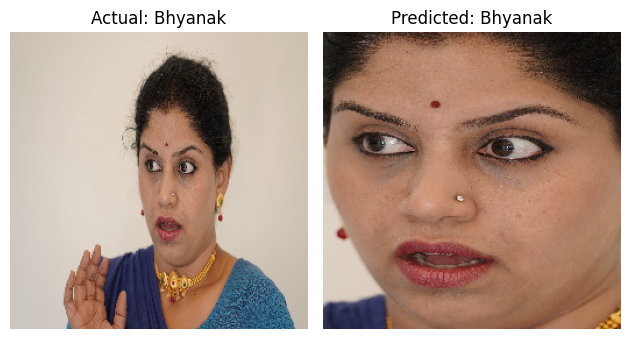

1/1 [==============================] - 0s 26ms/step


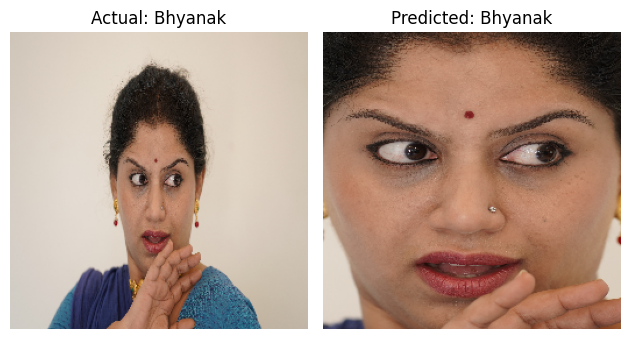

1/1 [==============================] - 0s 35ms/step


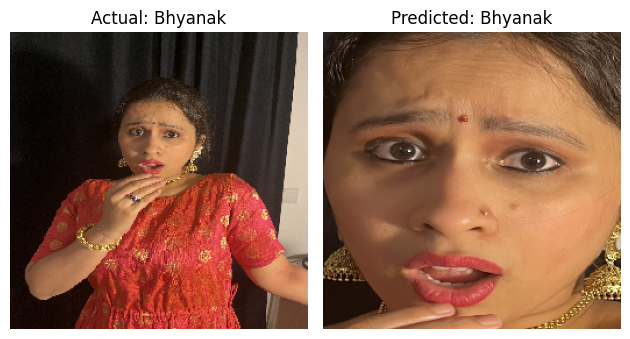

1/1 [==============================] - 0s 28ms/step


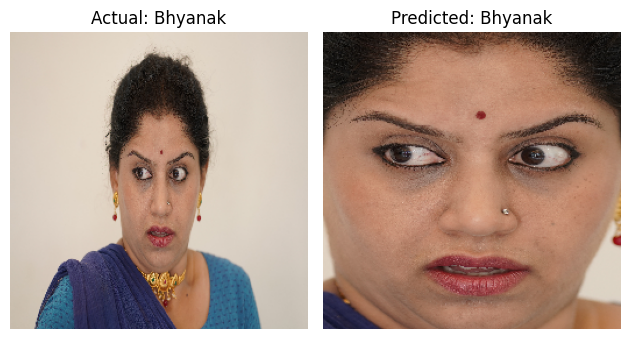

1/1 [==============================] - 0s 44ms/step


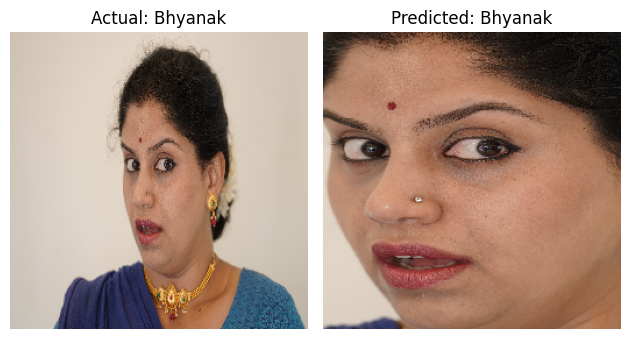

1/1 [==============================] - 0s 60ms/step


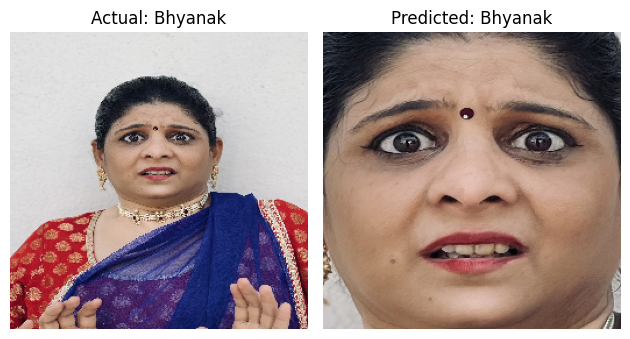

1/1 [==============================] - 0s 44ms/step


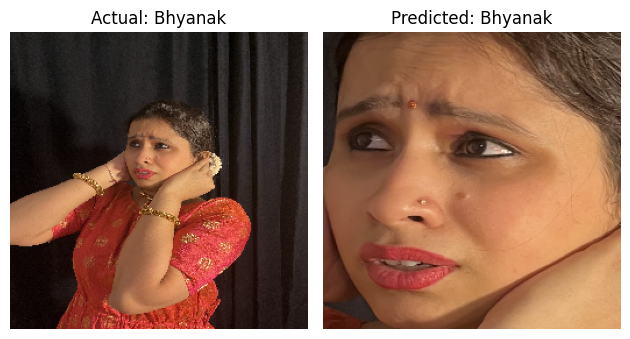

1/1 [==============================] - 0s 43ms/step


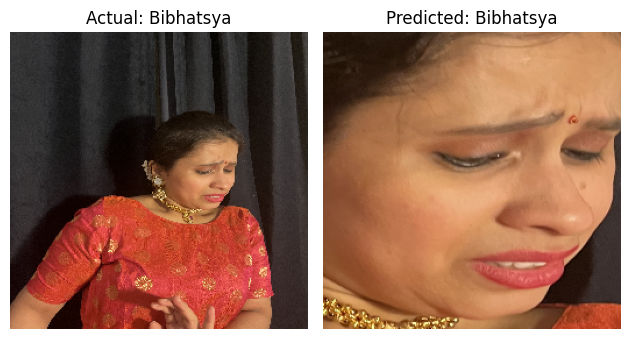

1/1 [==============================] - 0s 29ms/step


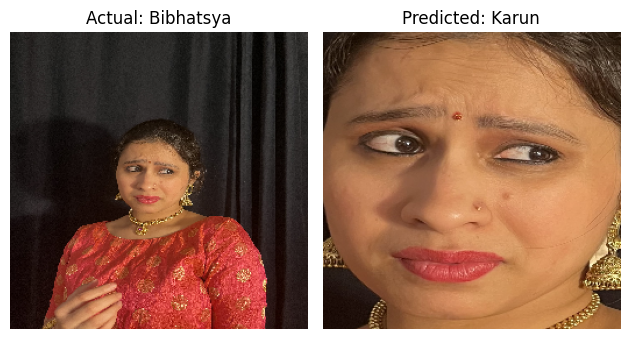

1/1 [==============================] - 0s 27ms/step


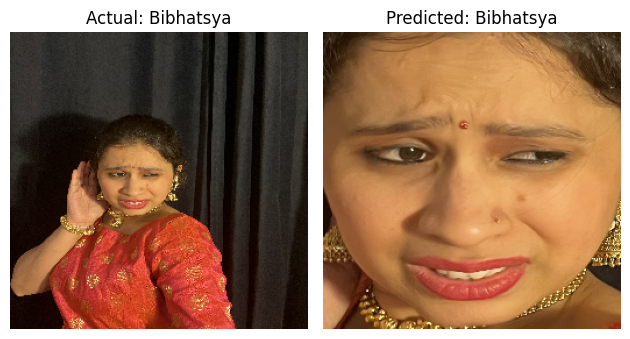

1/1 [==============================] - 0s 30ms/step


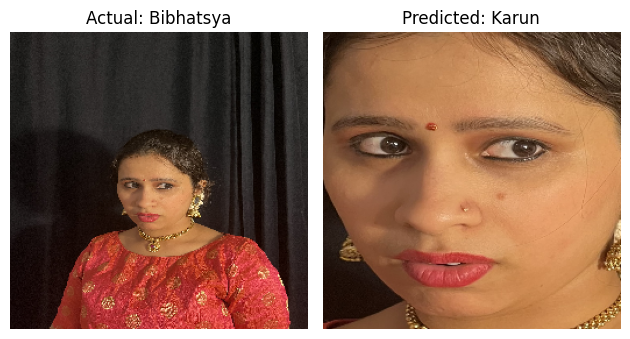

1/1 [==============================] - 0s 26ms/step


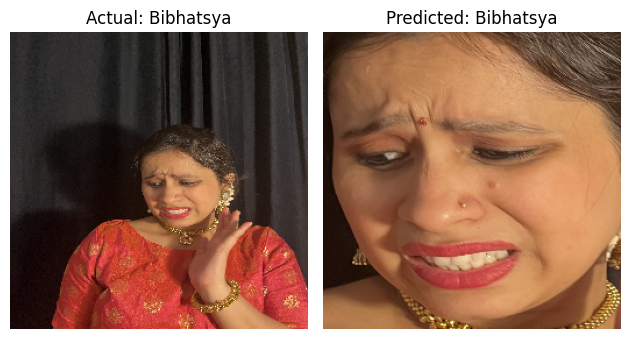

1/1 [==============================] - 0s 27ms/step


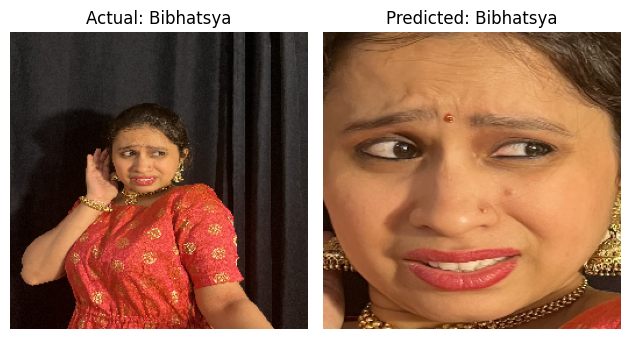

1/1 [==============================] - 0s 31ms/step


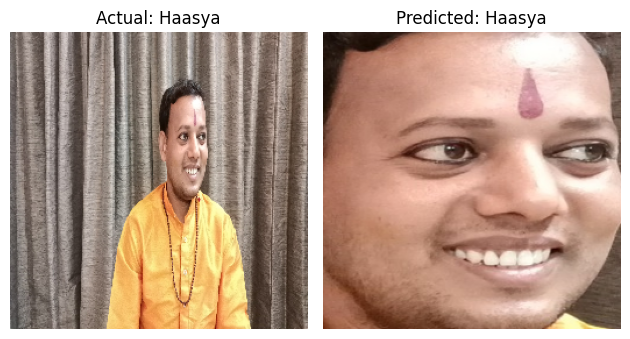

1/1 [==============================] - 0s 26ms/step


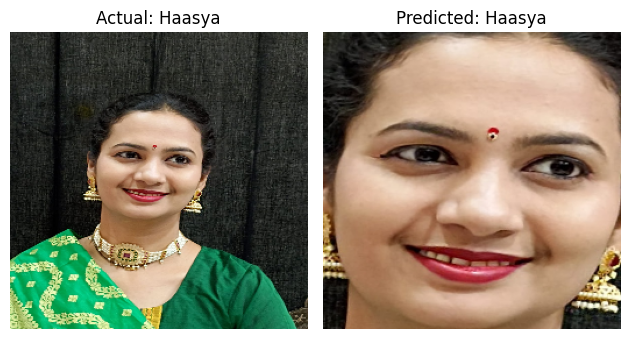

1/1 [==============================] - 0s 26ms/step


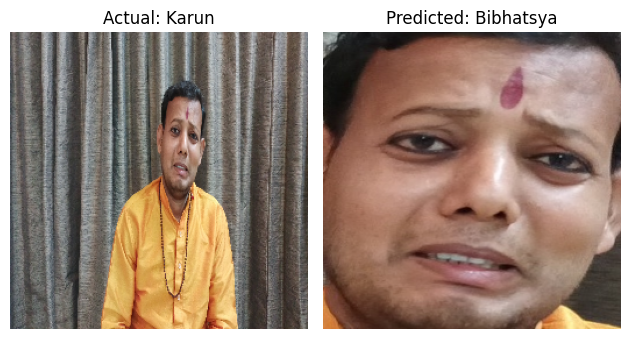

1/1 [==============================] - 0s 27ms/step


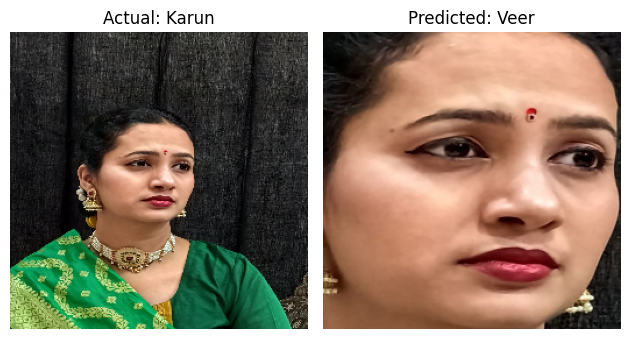

1/1 [==============================] - 0s 30ms/step


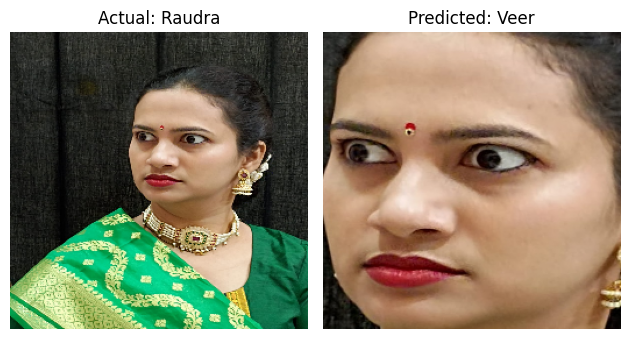

1/1 [==============================] - 0s 41ms/step


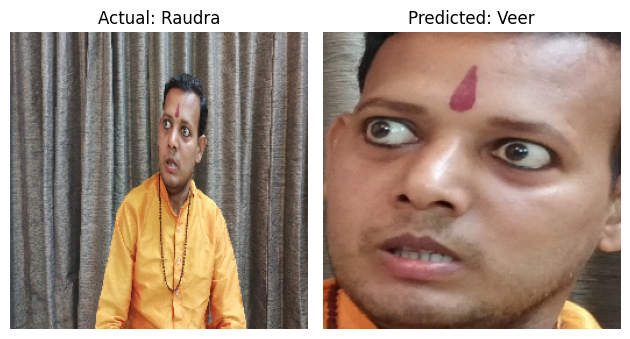

1/1 [==============================] - 0s 31ms/step


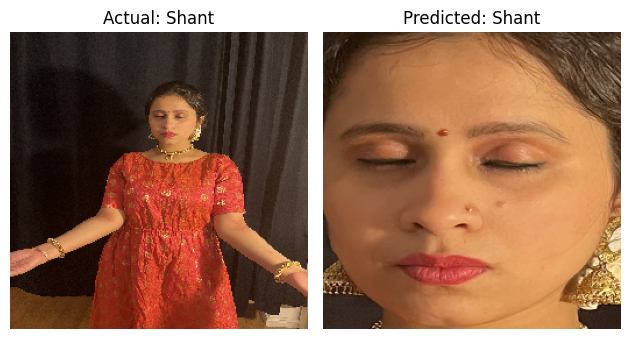

1/1 [==============================] - 0s 26ms/step


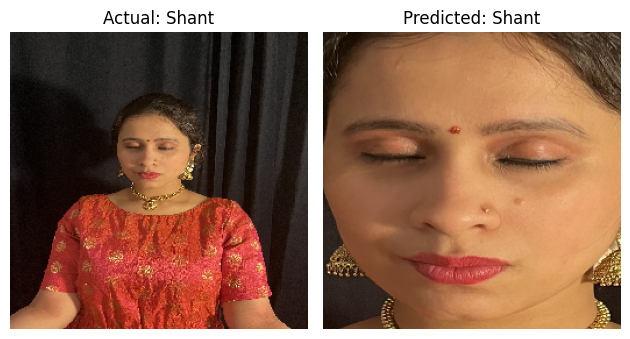

1/1 [==============================] - 0s 29ms/step


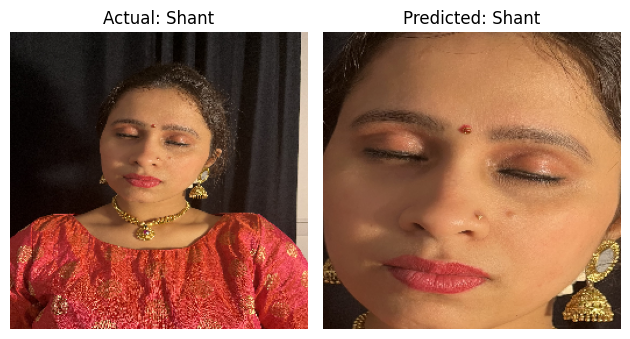

1/1 [==============================] - 0s 25ms/step


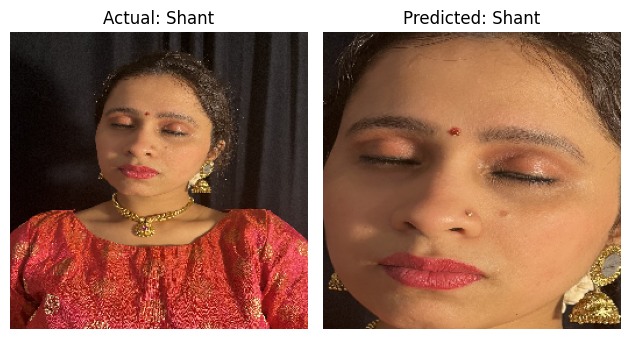

1/1 [==============================] - 0s 39ms/step


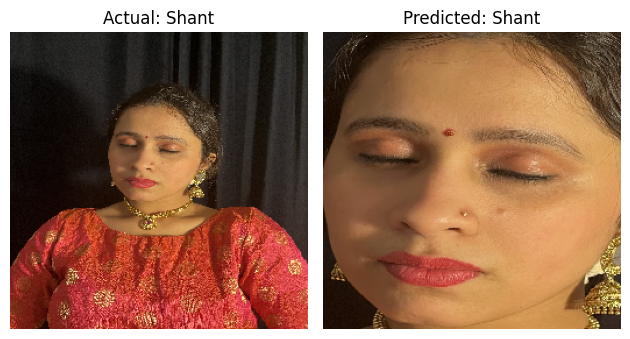

1/1 [==============================] - 0s 80ms/step


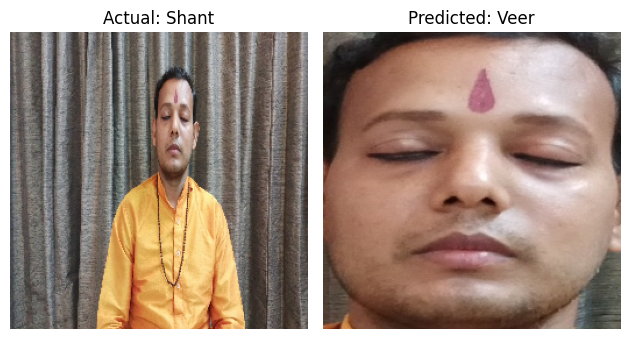

1/1 [==============================] - 0s 60ms/step


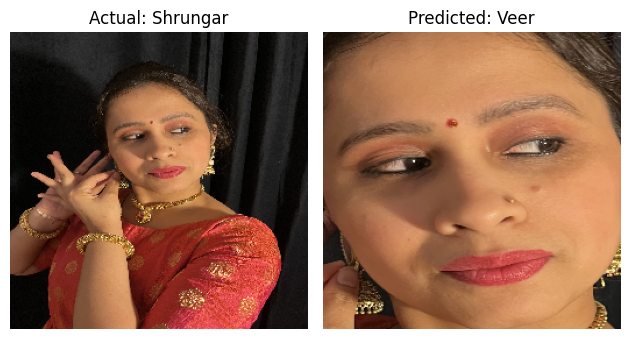

1/1 [==============================] - 0s 75ms/step


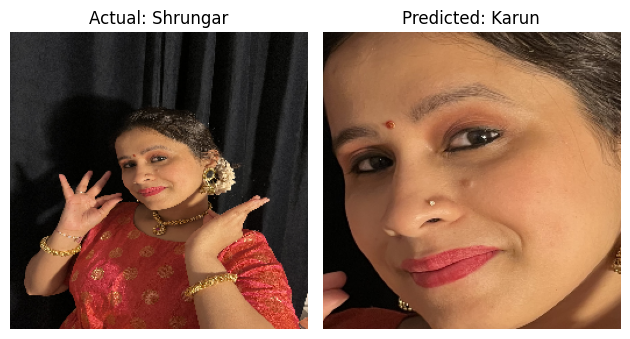

1/1 [==============================] - 0s 50ms/step


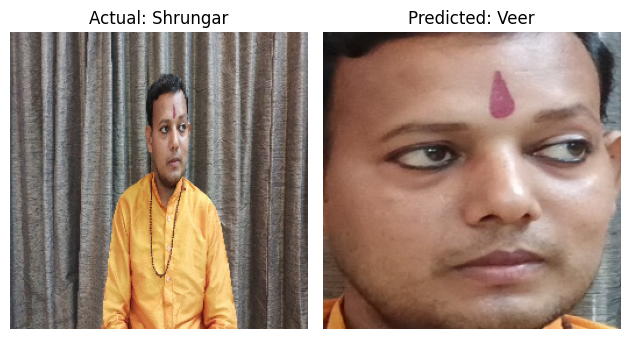

1/1 [==============================] - 0s 68ms/step


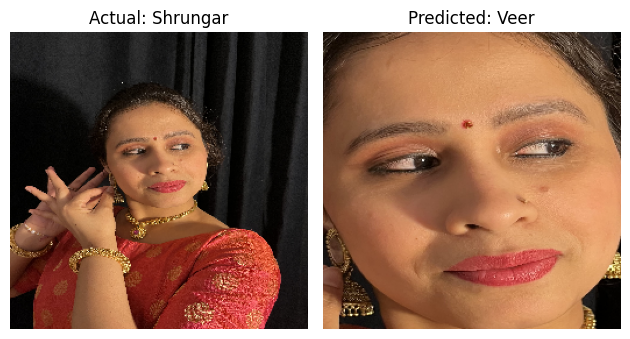

1/1 [==============================] - 0s 92ms/step


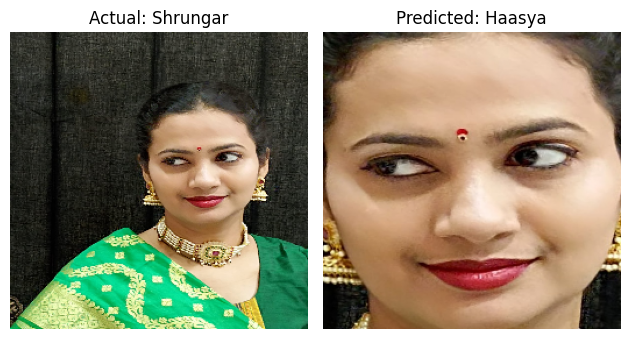

1/1 [==============================] - 0s 68ms/step


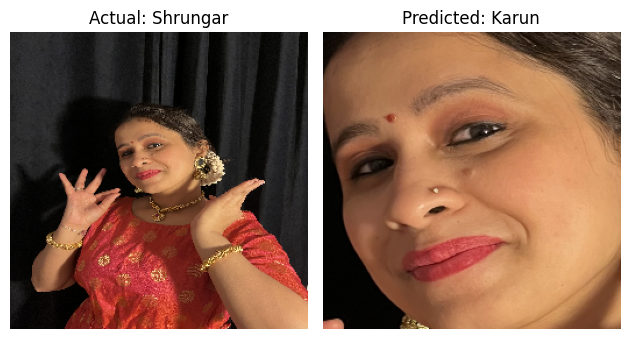

1/1 [==============================] - 0s 36ms/step


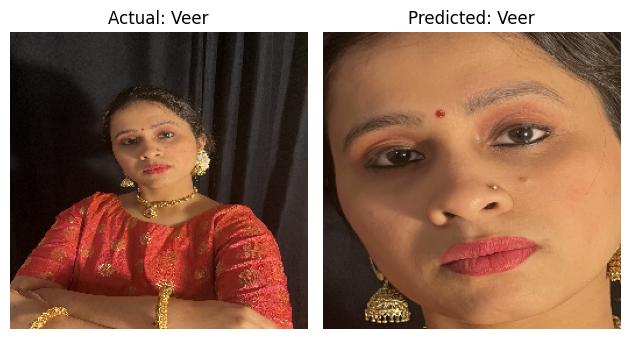

1/1 [==============================] - 0s 40ms/step


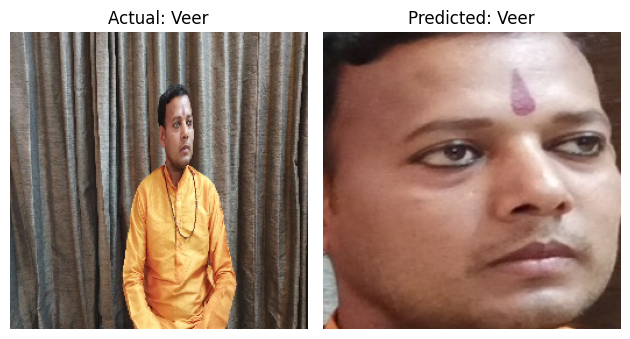

1/1 [==============================] - 0s 28ms/step


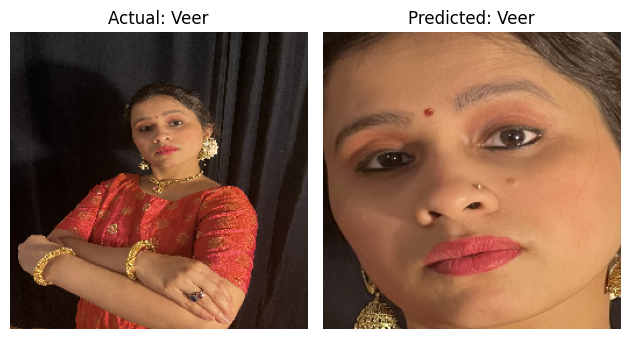

1/1 [==============================] - 0s 28ms/step


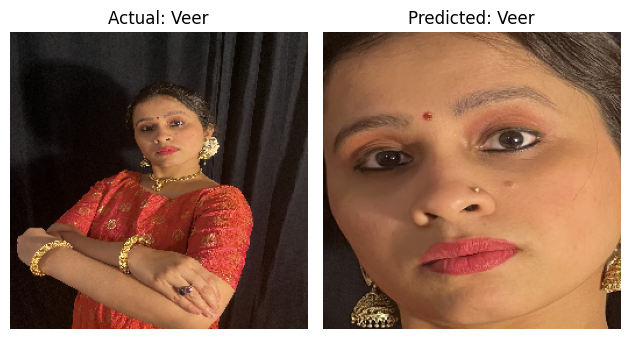

1/1 [==============================] - 0s 32ms/step


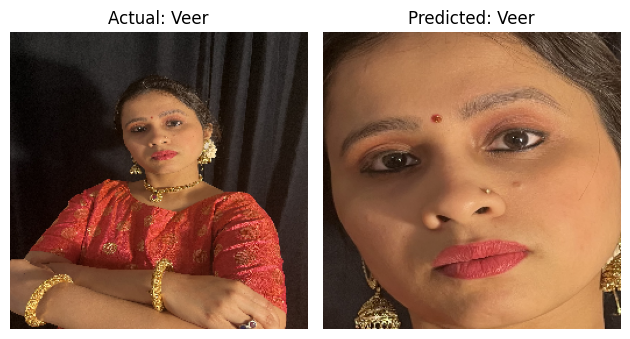

1/1 [==============================] - 0s 39ms/step


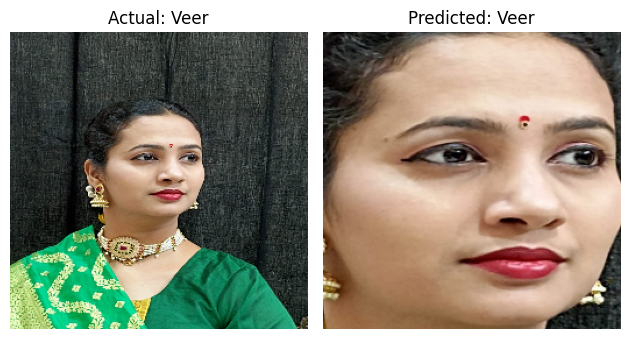

1/1 [==============================] - 0s 26ms/step


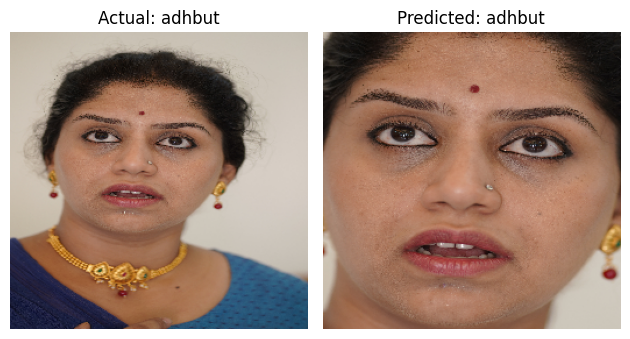

1/1 [==============================] - 0s 28ms/step


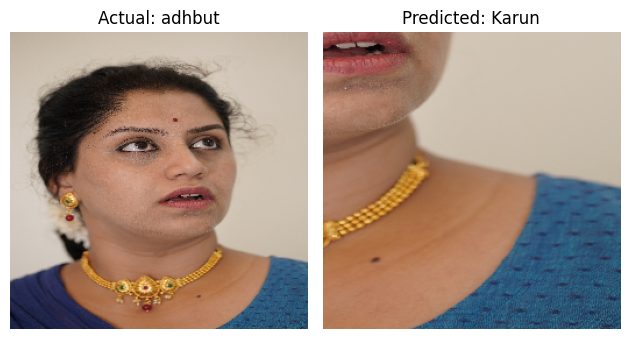

1/1 [==============================] - 0s 27ms/step


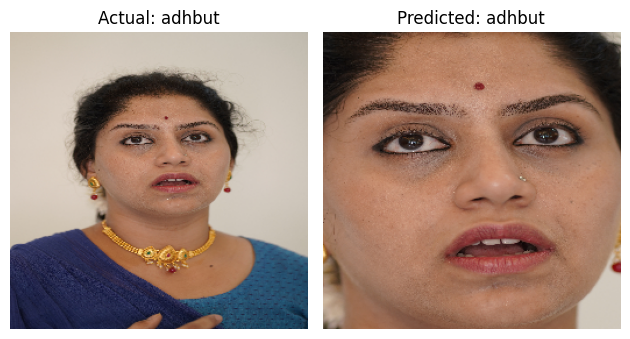

1/1 [==============================] - 0s 38ms/step


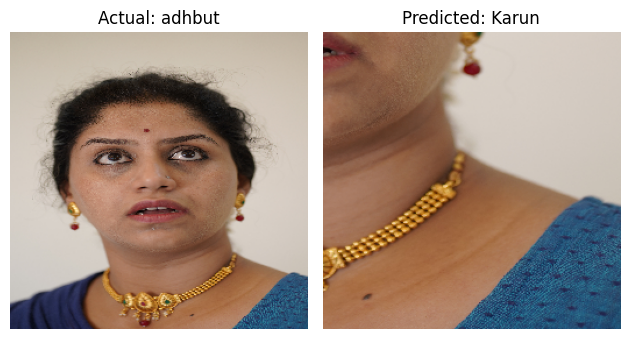

1/1 [==============================] - 0s 43ms/step


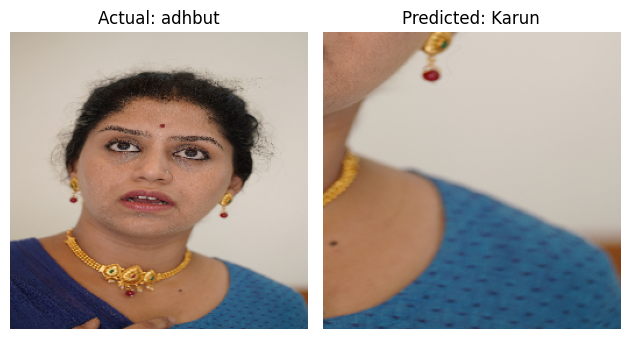

1/1 [==============================] - 0s 39ms/step


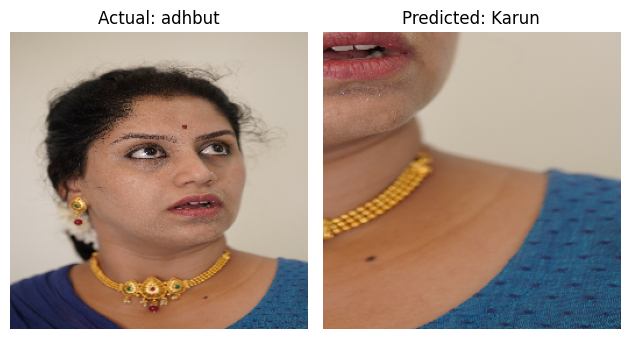

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define the class names
class_names = ['Bhyanak', 'Bibhatsya', 'Haasya', 'Karun', 'Raudra', 'Shant', 'Shrungar', 'Veer', 'adhbut']
image_size = (256, 256)

# Define the path to the validation images folder
validation_dir = '/content/extracted_faces'
val_orig = '/content/validation/'

# Iterate over the images in the validation folder
for class_name in class_names:
    class_dir = os.path.join(validation_dir, class_name)
    class2_dir = os.path.join(val_orig, class_name)

    for image_name in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_name)
        image2_path = os.path.join(class2_dir, image_name)

        #print(f'Image 1 Path: {image_path}')
        #print(f'Image 2 Path: {image2_path}')

        # Load and preprocess the images
        image = cv2.imread(image_path)
        image2 = cv2.imread(image2_path)

        if image is None:
            #print(f'Failed to load Image 1: {image_path}')
            continue

        if image2 is None:
            #print(f'Failed to load Image 2: {image2_path}')
            continue

        image = cv2.resize(image, image_size)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image2 = cv2.resize(image2, image_size)
        image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

        # Preprocess the image (resize, normalize, etc.) to match the training data preprocessing
        image = image / 255.0

        # Make a prediction on the preprocessed image using the Inception model
        prediction = model.predict(np.expand_dims(image, axis=0))
        predicted_label = np.argmax(prediction)

        # Get the predicted class name
        predicted_class = class_names[predicted_label]

        # Display the images side by side
        fig, axes = plt.subplots(1, 2)

        # Display the first image
        axes[0].imshow(image2)
        axes[0].set_title(f'Actual: {class_name}')
        axes[0].axis('off')

        # Display the second image
        axes[1].imshow(image)
        axes[1].set_title(f'Predicted: {predicted_class}')
        axes[1].axis('off')

        # Adjust the spacing between subplots
        plt.tight_layout()

        # Show the figure
        plt.show()


## Misc - Fixing file names

In [ ]:
import os

directory = '/content/validation'  # Replace with the path to your directory

# Iterate over the folders in the directory
for foldername in os.listdir(directory):
    folder_path = os.path.join(directory, foldername)

    # Check if the item is a directory
    if os.path.isdir(folder_path):
        # Iterate over the files in the folder
        for filename in os.listdir(folder_path):
            file_path = os.path.join(folder_path, filename)
            new_filename = filename.replace('.JPG', '.jpg')

            # Rename the file
            os.rename(file_path, os.path.join(folder_path, new_filename))

            print(f'Renamed {filename} to {new_filename}')
